In [1]:
# Manpulate
import numpy as np
import pandas as pd

# Visualization
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

# Feature Extraction
import user_agents # get info from user_agent (browser_info)
from ip2geotools.databases.noncommercial import DbIpCity as ip2geo # get location from ip
from geopy.distance import great_circle # distance btn 2 (lat,long)
from geopy.geocoders import Nominatim # geocode("place") / reverse("lat,long")
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer # text feature

# Pre-Processing
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer, KNNImputer # detect & handle NaNs
from sklearn.preprocessing import OrdinalEncoder, LabelEncoder, OneHotEncoder # Ordinal Encoding, Nominal Encoding
from category_encoders import BinaryEncoder # Nominal Encoding 
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler
from imblearn.over_sampling import SMOTE #over sampling _ under sambling
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler #scaling

In [2]:
df = pd.read_csv('HEALTH_HEART_2022.csv')
df.head(5)

,State,Sex,GeneralHealth,PhysicalHealthDays,MentalHealthDays,LastCheckupTime,PhysicalActivities,SleepHours,RemovedTeeth,HadHeartAttack,...,AgeCategory,HeightInMeters,WeightInKilograms,AlcoholDrinkers,HIVTesting,FluVaxLast12,PneumoVaxEver,TetanusLast10Tdap,HighRiskLastYear,CovidPos
0,Alabama,Female,Very good,0.0,0.0,Within past year (anytime less than 12 months ...,No,8.0,NaN,No,...,Age 80 or older,NaN,NaN,No,No,Yes,No,"Yes, received tetanus shot but not sure what type",No,No
1,Alabama,Female,Excellent,0.0,0.0,NaN,No,6.0,NaN,No,...,Age 80 or older,1.60,68.04,No,No,No,No,"No, did not receive any tetanus shot in the pa...",No,No
2,Alabama,Female,Very good,2.0,3.0,Within past year (anytime less than 12 months ...,Yes,5.0,NaN,No,...,Age 55 to 59,1.57,63.50,No,No,No,No,NaN,No,Yes
3,Alabama,Female,Excellent,0.0,0.0,Within past year (anytime less than 12 months ...,Yes,7.0,NaN,No,...,NaN,1.65,63.50,No,No,Yes,Yes,"No, did not receive any tetanus shot in the pa...",No,No
4,Alabama,Female,Fair,2.0,0.0,Within past year (anytime less than 12 months ...,Yes,9.0,NaN,No,...,Age 40 to 44,1.57,53.98,Yes,No,No,Yes,"No, did not receive any tetanus shot in the pa...",No,No


1) Understanding Data

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 445132 entries, 0 to 445131
Data columns (total 39 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   State                      445132 non-null  object 
 1   Sex                        445132 non-null  object 
 2   GeneralHealth              443934 non-null  object 
 3   PhysicalHealthDays         434205 non-null  float64
 4   MentalHealthDays           436065 non-null  float64
 5   LastCheckupTime            436824 non-null  object 
 6   PhysicalActivities         444039 non-null  object 
 7   SleepHours                 439679 non-null  float64
 8   RemovedTeeth               433772 non-null  object 
 9   HadHeartAttack             442067 non-null  object 
 10  HadAngina                  440727 non-null  object 
 11  HadStroke                  443575 non-null  object 
 12  HadAsthma                  443359 non-null  object 
 13  HadSkinCancer              44

In [4]:
df.columns

Index(['State', 'Sex', 'GeneralHealth', 'PhysicalHealthDays',
       'MentalHealthDays', 'LastCheckupTime', 'PhysicalActivities',
       'SleepHours', 'RemovedTeeth', 'HadHeartAttack', 'HadAngina',
       'HadStroke', 'HadAsthma', 'HadSkinCancer', 'HadCOPD',
       'HadDepressiveDisorder', 'HadKidneyDisease', 'HadArthritis',
       'HadDiabetes', 'DeafOrHardOfHearing', 'BlindOrVisionDifficulty',
       'DifficultyConcentrating', 'DifficultyWalking',
       'DifficultyDressingBathing', 'DifficultyErrands', 'SmokerStatus',
       'ECigaretteUsage', 'ChestScan', 'RaceEthnicityCategory', 'AgeCategory',
       'HeightInMeters', 'WeightInKilograms', 'AlcoholDrinkers', 'HIVTesting',
       'FluVaxLast12', 'PneumoVaxEver', 'TetanusLast10Tdap',
       'HighRiskLastYear', 'CovidPos'],
      dtype='object')

In [5]:
df.describe()
#PhysicalHealthDays have out lair in max all data near min 0 (30.000000)
#  alot of people have healthy days so maybe its correct data
#MentalHealthDays have out lair in max all data near min 0 (30.000000)
#  alot of people have healthy days so maybe its correct data

#SleepHours have out lair in max 24.000000 and sleep one hour ?? need to check that too
         #[1553 have slept less than 4 hours and slept more than 12 hours] 
         
#WeightInKilograms have out lair in max and may be outlair in min 292.570000	
            #there is alot of data have there weight above 200 and the BMI is correct and US is well known
                #as haveing larg number of obesity so the data is correct
#WeightInKilograms have weird data with 22kg in min

,PhysicalHealthDays,MentalHealthDays,SleepHours,HeightInMeters,WeightInKilograms
count,434205.000000,436065.000000,439679.000000,416480.000000,403054.000000
mean,4.347919,4.382649,7.022983,1.702691,83.074470
std,8.688912,8.387475,1.502425,0.107177,21.448173
min,0.000000,0.000000,1.000000,0.910000,22.680000
25%,0.000000,0.000000,6.000000,1.630000,68.040000
50%,0.000000,0.000000,7.000000,1.700000,80.740000
75%,3.000000,5.000000,8.000000,1.780000,95.250000
max,30.000000,30.000000,24.000000,2.410000,292.570000


In [6]:
df[(df['SleepHours'] > 4) & (df['SleepHours'] > 12)]

,State,Sex,GeneralHealth,PhysicalHealthDays,MentalHealthDays,LastCheckupTime,PhysicalActivities,SleepHours,RemovedTeeth,HadHeartAttack,...,AgeCategory,HeightInMeters,WeightInKilograms,AlcoholDrinkers,HIVTesting,FluVaxLast12,PneumoVaxEver,TetanusLast10Tdap,HighRiskLastYear,CovidPos
118,Alabama,Female,Poor,30.0,30.0,Within past year (anytime less than 12 months ...,No,18.0,NaN,Yes,...,Age 80 or older,1.50,47.17,No,No,No,No,"No, did not receive any tetanus shot in the pa...",No,No
623,Alabama,Female,Fair,0.0,0.0,Within past year (anytime less than 12 months ...,No,18.0,All,No,...,Age 70 to 74,1.63,81.65,NaN,NaN,NaN,NaN,NaN,NaN,NaN
676,Alabama,Female,Poor,30.0,10.0,Within past 2 years (1 year but less than 2 ye...,No,18.0,All,No,...,Age 80 or older,1.70,93.89,No,No,No,Yes,"No, did not receive any tetanus shot in the pa...",No,No
1205,Alabama,Female,Very good,0.0,15.0,Within past year (anytime less than 12 months ...,Yes,16.0,"6 or more, but not all",No,...,Age 70 to 74,1.63,85.73,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1320,Alabama,Female,Good,15.0,15.0,Within past year (anytime less than 12 months ...,No,15.0,NaN,No,...,Age 60 to 64,1.63,86.18,No,No,Yes,Yes,"Yes, received Tdap",No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
444751,Virgin Islands,Female,Very good,0.0,0.0,NaN,Yes,20.0,"6 or more, but not all",No,...,Age 35 to 39,1.68,NaN,No,Yes,No,No,"No, did not receive any tetanus shot in the pa...",No,No
444778,Virgin Islands,Female,Fair,7.0,0.0,Within past year (anytime less than 12 months ...,No,15.0,All,No,...,Age 70 to 74,1.60,58.97,No,Yes,No,Yes,"No, did not receive any tetanus shot in the pa...",No,No
444948,Virgin Islands,Female,Fair,2.0,1.0,Within past year (anytime less than 12 months ...,Yes,18.0,1 to 5,No,...,Age 60 to 64,1.65,99.79,Yes,No,Yes,No,"No, did not receive any tetanus shot in the pa...",No,No
445066,Virgin Islands,Male,Very good,NaN,0.0,Within past year (anytime less than 12 months ...,Yes,20.0,All,No,...,Age 80 or older,1.80,86.18,No,No,Yes,Yes,"Yes, received tetanus shot but not sure what type",No,No


In [7]:
df_high_weight = df[df['WeightInKilograms'] > 200]
df_high_weight[['WeightInKilograms', 'HeightInMeters']]

,WeightInKilograms,HeightInMeters
3148,204.12,1.83
5988,281.00,1.80
7408,206.38,1.80
8000,249.48,1.78
12278,250.00,1.65
...,...,...
433569,215.46,1.83
434085,290.30,1.88
435355,204.12,1.96
436737,204.12,1.83


In [8]:
df_high_weight.groupby('State')['WeightInKilograms'].count().reset_index().sort_values(by=['WeightInKilograms'], ascending=False).head(10)

,State,WeightInKilograms
35,Ohio,23
45,Washington,19
21,Massachusetts,12
10,Georgia,12
39,South Carolina,11
4,California,11
14,Indiana,11
17,Kentucky,10
13,Idaho,9
42,Texas,8


In [9]:
df_low_weight = df[df['WeightInKilograms'] < 35]
df_low_weight

,State,Sex,GeneralHealth,PhysicalHealthDays,MentalHealthDays,LastCheckupTime,PhysicalActivities,SleepHours,RemovedTeeth,HadHeartAttack,...,AgeCategory,HeightInMeters,WeightInKilograms,AlcoholDrinkers,HIVTesting,FluVaxLast12,PneumoVaxEver,TetanusLast10Tdap,HighRiskLastYear,CovidPos
49,Alabama,Female,Good,0.0,0.0,Within past year (anytime less than 12 months ...,Yes,7.0,NaN,No,...,Age 75 to 79,1.60,34.47,No,Yes,No,Yes,NaN,No,No
808,Alabama,Female,Fair,30.0,30.0,Within past year (anytime less than 12 months ...,No,5.0,NaN,Yes,...,Age 65 to 69,NaN,34.93,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1157,Alabama,Female,Fair,NaN,0.0,Within past year (anytime less than 12 months ...,Yes,6.0,"6 or more, but not all",No,...,Age 80 or older,1.68,31.75,No,No,No,No,"No, did not receive any tetanus shot in the pa...",No,No
11310,Arizona,Female,Fair,10.0,10.0,Within past year (anytime less than 12 months ...,No,6.0,"6 or more, but not all",No,...,Age 60 to 64,1.60,24.00,No,No,Yes,No,"No, did not receive any tetanus shot in the pa...",No,No
11945,Arizona,Female,Fair,0.0,0.0,Within past year (anytime less than 12 months ...,No,NaN,"6 or more, but not all",No,...,Age 80 or older,1.57,34.02,Yes,No,Yes,Yes,"Yes, received Tdap",No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
436749,Guam,Male,Good,0.0,30.0,Within past 2 years (1 year but less than 2 ye...,Yes,6.0,None of them,No,...,Age 60 to 64,1.78,28.58,Yes,No,No,No,"Yes, received tetanus shot but not sure what type",No,Yes
436961,Guam,Female,Good,0.0,0.0,5 or more years ago,Yes,6.0,1 to 5,No,...,Age 18 to 24,1.47,34.02,NaN,NaN,NaN,NaN,NaN,NaN,NaN
438470,Puerto Rico,Female,Good,30.0,0.0,Within past year (anytime less than 12 months ...,No,8.0,1 to 5,No,...,Age 80 or older,1.50,34.02,No,No,Yes,NaN,NaN,No,No
439506,Puerto Rico,Female,Good,7.0,3.0,Within past year (anytime less than 12 months ...,No,8.0,1 to 5,No,...,Age 18 to 24,1.40,31.75,No,No,No,No,NaN,No,Yes


In [10]:
# Describe Cat columns
cat_cols = df.select_dtypes(include="O").columns
for col in cat_cols:
    print(f"number of uniques of \'{col}\': {df[col].nunique()}")
    print(f"uniques of \'{col}\': {df[col].unique()}")
    print()
    print("*" * 50)
    print()

number of uniques of 'State': 54
uniques of 'State': ['Alabama' 'Alaska' 'Arizona' 'Arkansas' 'California' 'Colorado'
 'Connecticut' 'Delaware' 'District of Columbia' 'Florida' 'Georgia'
 'Hawaii' 'Idaho' 'Illinois' 'Indiana' 'Iowa' 'Kansas' 'Kentucky'
 'Louisiana' 'Maine' 'Maryland' 'Massachusetts' 'Michigan' 'Minnesota'
 'Mississippi' 'Missouri' 'Montana' 'Nebraska' 'Nevada' 'New Hampshire'
 'New Jersey' 'New Mexico' 'New York' 'North Carolina' 'North Dakota'
 'Ohio' 'Oklahoma' 'Oregon' 'Pennsylvania' 'Rhode Island' 'South Carolina'
 'South Dakota' 'Tennessee' 'Texas' 'Utah' 'Vermont' 'Virginia'
 'Washington' 'West Virginia' 'Wisconsin' 'Wyoming' 'Guam' 'Puerto Rico'
 'Virgin Islands']

**************************************************

number of uniques of 'Sex': 2
uniques of 'Sex': ['Female' 'Male']

**************************************************

number of uniques of 'GeneralHealth': 5
uniques of 'GeneralHealth': ['Very good' 'Excellent' 'Fair' 'Poor' 'Good' nan]

***********

In [11]:
cat_colu = df.select_dtypes(include='O').columns
for col in cat_colu:
    print(f'the count of uniques in \'{col}\' is {df[col].value_counts()}')
    print()
    print('*' * 50)
    print()

the count of uniques in 'State' is State
Washington              26152
New York                17800
Minnesota               16821
Ohio                    16487
Maryland                16418
Texas                   14245
Florida                 13393
Wisconsin               11276
Kansas                  11247
Massachusetts           11029
California              10952
Maine                   10646
Indiana                 10466
Virginia                10417
Arizona                 10185
Michigan                10058
South Carolina          10037
Utah                     9826
Connecticut              9784
Colorado                 9365
Georgia                  9236
Iowa                     8949
Vermont                  8811
New Jersey               8209
Hawaii                   7747
Nebraska                 7473
Missouri                 7438
South Dakota             7424
Montana                  7048
New Hampshire            6757
Idaho                    6280
Rhode Island             5893

2) EXTRACT FEATURES + EDA (uni - bi(heatmap) - multi) -> Insights:

In [12]:
#extract BMI
def calu_bmi(data):
    if pd.isna(data['WeightInKilograms']) or pd.isna(data['HeightInMeters']):
        return np.nan
    else:
        return data['WeightInKilograms'] / data['HeightInMeters'] **2

In [13]:
df['BMI'] = df.apply(calu_bmi, axis=1)

In [14]:
def extract_chronic_condition(data):#the cronic conditions is'HadHeartAttack', 'HadAngina','HadStroke', 'HadAsthma', 'HadSkinCancer', 'HadCOPD','HadDepressiveDisorder', 'HadKidneyDisease', 'HadArthritis','HadDiabetes'
    chronic_condition = ['HadHeartAttack', 'HadAngina',
       'HadStroke', 'HadAsthma', 'HadSkinCancer', 'HadCOPD',
       'HadDepressiveDisorder', 'HadKidneyDisease', 'HadArthritis',
       'HadDiabetes']
    if data[chronic_condition].isna().all():
        return np.nan
    for condition in chronic_condition:
        if data[condition] == 'Yes':
            return 'HadChronicCondion'
    return 'NoChronicCondition'

In [15]:
df['ChronicCondition'] = df.apply(extract_chronic_condition, axis=1)

In [16]:
def Health_score (data):
    score  = 50
    #first 'GeneralHealth': ['Very good' 'Excellent' 'Fair' 'Poor' 'Good' nan]
    if data['GeneralHealth'] == 'Excellent':
        score += 10
    elif data['GeneralHealth'] == 'Very good':
        score += 7
    elif data['GeneralHealth'] == 'Good':
        score += 5
    elif data['GeneralHealth'] == 'Fair':
        score -= 5
    elif data['GeneralHealth'] == 'Poor':
        score -= 10
    else:
        score += 0
    #'PhysicalHealthDays': 31
    if data['PhysicalHealthDays'] <= 5:
        score += 10
    elif (data['PhysicalHealthDays'] >= 6) & (data['PhysicalHealthDays'] <= 10):
        score += 5
    elif (data['PhysicalHealthDays'] >= 11) & (data['PhysicalHealthDays'] <= 20):
        score -= 7
    elif data['PhysicalHealthDays'] >= 21 :
        score -=  10
    else:
        score += 0
    #MentalHealthDays': 31
    if data['MentalHealthDays'] <= 5:
        score += 10
    elif (data['MentalHealthDays'] >= 6) & (data['MentalHealthDays'] <= 10):
        score += 5
    elif (data['MentalHealthDays'] >= 11) & (data['MentalHealthDays'] <= 20):
        score -= 7
    elif data['MentalHealthDays'] >= 21 :
        score -=  10
    else:
        score += 0
    #BMI (18.5-24.9) ideal //  min = 6.768013 max= 235.527110 mean = 28.531598
    if 18.5 <= data['BMI'] <= 24.9:
        score += 10
    elif 25 <= data['BMI'] <= 29.9:
        score += 5
    elif 30 <= data['BMI'] <= 39.9:
        score -= 7
    elif data['BMI'] >= 40 or data['BMI'] < 18.5:
        score -= 10
    else:
        score += 0
    #'SleepHours': 24
    if 6 <= data['SleepHours'] <= 9:
        score += 10
    elif 9 < data['SleepHours'] <= 12:
        score += 5
    elif 12 < data['SleepHours'] <= 24:
        score -= 7
    elif data['SleepHours'] < 6:
        score -= 10
    else:
        score += 0
    #'SmokerStatus': ['Never smoked' 'Current smoker - now smokes some days' 'Former smoker', 'Current smoker - now smokes every day']
    if data['SmokerStatus'] == 'Never smoked':
        score += 10
    elif data['SmokerStatus'] == 'Former smoker':
        score += 7
    elif data['SmokerStatus'] == 'Current smoker - now smokes some days':
        score -= 7
    elif data['SmokerStatus'] == 'Current smoker - now smokes every day':
        score -= 10
    else:
        score += 0
    #'ECigaretteUsage': ['Not at all (right now)' 'Never used e-cigarettes in my entire life' 'Use them every day' 'Use them some days']
    if data['ECigaretteUsage'] == 'Never used e-cigarettes in my entire life':
        score += 10
    elif data['ECigaretteUsage'] == 'Not at all (right now)':
        score += 5
    elif data['ECigaretteUsage'] == 'Use them some days':
        score -= 7
    elif data['ECigaretteUsage'] == 'Use them every day':
        score -= 10
    else:
        score += 0
    #'AlcoholDrinkers': ['No' 'Yes' nan]
    if data['AlcoholDrinkers'] == 'No':
        score += 10
    elif data['AlcoholDrinkers'] == 'Yes':
        score -= 10
    else:
        score += 0

    score = max(0, min(score, 100))
    
    return score


In [17]:
df['HealthScore'] = df.apply(Health_score, axis=1)

In [18]:
df.columns
    #    'State','DeafOrHardOfHearing', 'BlindOrVisionDifficulty',
    #    'DifficultyConcentrating', 'DifficultyWalking',
    #    'DifficultyDressingBathing', 'DifficultyErrands', 'RaceEthnicityCategory',
    #    'RemovedTeeth', 'HeightInMeters'
    # drop these columns bec will not help in our annalyzing with the target Had Heart attack

Index(['State', 'Sex', 'GeneralHealth', 'PhysicalHealthDays',
       'MentalHealthDays', 'LastCheckupTime', 'PhysicalActivities',
       'SleepHours', 'RemovedTeeth', 'HadHeartAttack', 'HadAngina',
       'HadStroke', 'HadAsthma', 'HadSkinCancer', 'HadCOPD',
       'HadDepressiveDisorder', 'HadKidneyDisease', 'HadArthritis',
       'HadDiabetes', 'DeafOrHardOfHearing', 'BlindOrVisionDifficulty',
       'DifficultyConcentrating', 'DifficultyWalking',
       'DifficultyDressingBathing', 'DifficultyErrands', 'SmokerStatus',
       'ECigaretteUsage', 'ChestScan', 'RaceEthnicityCategory', 'AgeCategory',
       'HeightInMeters', 'WeightInKilograms', 'AlcoholDrinkers', 'HIVTesting',
       'FluVaxLast12', 'PneumoVaxEver', 'TetanusLast10Tdap',
       'HighRiskLastYear', 'CovidPos', 'BMI', 'ChronicCondition',
       'HealthScore'],
      dtype='object')

In [19]:
df.drop(['State','DeafOrHardOfHearing', 'BlindOrVisionDifficulty',
       'DifficultyConcentrating', 'DifficultyWalking',
       'DifficultyDressingBathing', 'DifficultyErrands', 'RaceEthnicityCategory',
       'RemovedTeeth', 'HeightInMeters'], axis=1, inplace= True)

In [20]:
df.columns

Index(['Sex', 'GeneralHealth', 'PhysicalHealthDays', 'MentalHealthDays',
       'LastCheckupTime', 'PhysicalActivities', 'SleepHours', 'HadHeartAttack',
       'HadAngina', 'HadStroke', 'HadAsthma', 'HadSkinCancer', 'HadCOPD',
       'HadDepressiveDisorder', 'HadKidneyDisease', 'HadArthritis',
       'HadDiabetes', 'SmokerStatus', 'ECigaretteUsage', 'ChestScan',
       'AgeCategory', 'WeightInKilograms', 'AlcoholDrinkers', 'HIVTesting',
       'FluVaxLast12', 'PneumoVaxEver', 'TetanusLast10Tdap',
       'HighRiskLastYear', 'CovidPos', 'BMI', 'ChronicCondition',
       'HealthScore'],
      dtype='object')

Uni-variate Analysis

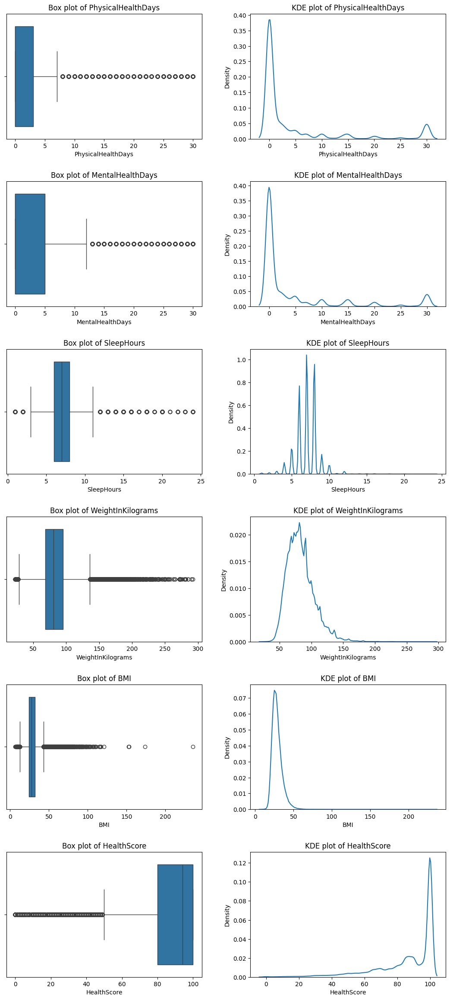

In [21]:
num_col = df.select_dtypes(include='number').columns
fig, axes = plt.subplots(nrows=len(num_col), ncols=2, figsize=(12, len(num_col) * 4))
fig.tight_layout(pad=5.0)

for i, col in enumerate(num_col):
    # Box plot
    sns.boxplot(x=df[col], ax=axes[i, 0])
    axes[i, 0].set_title(f'Box plot of {col}')
    
    # KDE plot
    sns.kdeplot(x=df[col], ax=axes[i, 1])
    axes[i, 1].set_title(f'KDE plot of {col}')


In [22]:
cat_colu = df.select_dtypes(include='O').columns
for col in cat_colu:
    if df[col].nunique() < 7:
        dff = df.groupby(col).size().reset_index(name='count').sort_values(by='count', ascending=False)
        cat_fig = px.pie(dff, names=col, values='count', title=f'Distribution of {col}')
        cat_fig.show()
    else:
        cat_fig_2 = px.histogram(df, x=col , title=f'distribution of {col}')
        cat_fig_2.show()

Bi-Variate Analysis

In [23]:
df.columns

Index(['Sex', 'GeneralHealth', 'PhysicalHealthDays', 'MentalHealthDays',
       'LastCheckupTime', 'PhysicalActivities', 'SleepHours', 'HadHeartAttack',
       'HadAngina', 'HadStroke', 'HadAsthma', 'HadSkinCancer', 'HadCOPD',
       'HadDepressiveDisorder', 'HadKidneyDisease', 'HadArthritis',
       'HadDiabetes', 'SmokerStatus', 'ECigaretteUsage', 'ChestScan',
       'AgeCategory', 'WeightInKilograms', 'AlcoholDrinkers', 'HIVTesting',
       'FluVaxLast12', 'PneumoVaxEver', 'TetanusLast10Tdap',
       'HighRiskLastYear', 'CovidPos', 'BMI', 'ChronicCondition',
       'HealthScore'],
      dtype='object')

In [27]:
#drop nan from the target column which is had heart attack
df = df.dropna(subset=['HadHeartAttack'])
df.reset_index(drop=True, inplace=True)

In [28]:
df['HadHeartAttack'].isna().sum()

0

In [29]:
# our target is HadHeartAttack so we will encode this to see his colleration with other Features
oht_encoder = OneHotEncoder(sparse_output=False, drop='first')
df['HadHeartAttack'] = oht_encoder.fit_transform(df[['HadHeartAttack']])
df

,Sex,GeneralHealth,PhysicalHealthDays,MentalHealthDays,LastCheckupTime,PhysicalActivities,SleepHours,HadHeartAttack,HadAngina,HadStroke,...,AlcoholDrinkers,HIVTesting,FluVaxLast12,PneumoVaxEver,TetanusLast10Tdap,HighRiskLastYear,CovidPos,BMI,ChronicCondition,HealthScore
0,Female,Very good,0.0,0.0,Within past year (anytime less than 12 months ...,No,8.0,0.0,No,No,...,No,No,Yes,No,"Yes, received tetanus shot but not sure what type",No,No,NaN,HadChronicCondion,100
1,Female,Excellent,0.0,0.0,NaN,No,6.0,0.0,No,No,...,No,No,No,No,"No, did not receive any tetanus shot in the pa...",No,No,26.578125,HadChronicCondion,100
2,Female,Very good,2.0,3.0,Within past year (anytime less than 12 months ...,Yes,5.0,0.0,No,No,...,No,No,No,No,NaN,No,Yes,25.761694,HadChronicCondion,100
3,Female,Excellent,0.0,0.0,Within past year (anytime less than 12 months ...,Yes,7.0,0.0,No,No,...,No,No,Yes,Yes,"No, did not receive any tetanus shot in the pa...",No,No,23.324151,HadChronicCondion,100
4,Female,Fair,2.0,0.0,Within past year (anytime less than 12 months ...,Yes,9.0,0.0,No,No,...,Yes,No,No,Yes,"No, did not receive any tetanus shot in the pa...",No,No,21.899469,NoChronicCondition,95
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
442062,Female,Good,0.0,3.0,Within past 2 years (1 year but less than 2 ye...,Yes,6.0,0.0,No,No,...,NaN,Yes,No,No,"No, did not receive any tetanus shot in the pa...",No,Yes,25.656566,HadChronicCondion,100
442063,Female,Excellent,2.0,2.0,Within past year (anytime less than 12 months ...,Yes,7.0,0.0,No,No,...,No,Yes,Yes,No,"Yes, received tetanus shot but not sure what type",No,No,28.723183,NoChronicCondition,100
442064,Female,Poor,30.0,30.0,5 or more years ago,No,5.0,0.0,No,No,...,NaN,No,No,No,"No, did not receive any tetanus shot in the pa...",No,No,17.266436,NoChronicCondition,0
442065,Male,Very good,0.0,0.0,Within past year (anytime less than 12 months ...,No,5.0,1.0,No,No,...,No,Yes,Yes,Yes,"No, did not receive any tetanus shot in the pa...",No,Yes,32.506196,HadChronicCondion,90


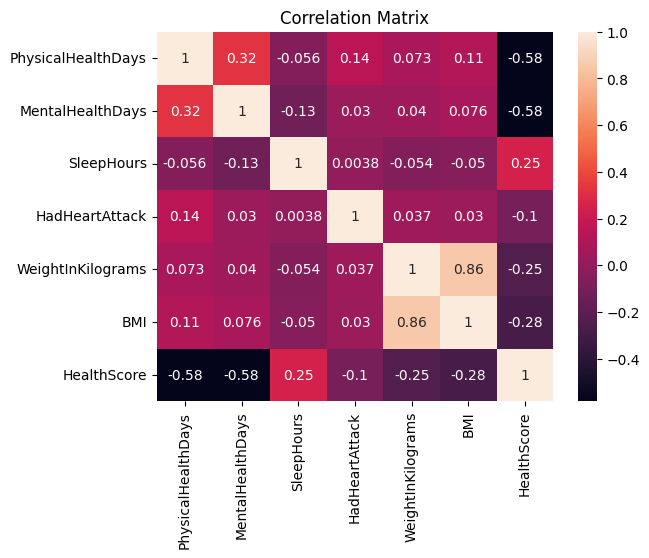

In [30]:
numeric_df =df.select_dtypes(include=['number'])
sns.heatmap(numeric_df.corr(), annot=True)
plt.title('Correlation Matrix')
plt.show()
# the target has correlation with physical health days but have negative corr with health score

In [31]:
df.head(5)

,Sex,GeneralHealth,PhysicalHealthDays,MentalHealthDays,LastCheckupTime,PhysicalActivities,SleepHours,HadHeartAttack,HadAngina,HadStroke,...,AlcoholDrinkers,HIVTesting,FluVaxLast12,PneumoVaxEver,TetanusLast10Tdap,HighRiskLastYear,CovidPos,BMI,ChronicCondition,HealthScore
0,Female,Very good,0.0,0.0,Within past year (anytime less than 12 months ...,No,8.0,0.0,No,No,...,No,No,Yes,No,"Yes, received tetanus shot but not sure what type",No,No,NaN,HadChronicCondion,100
1,Female,Excellent,0.0,0.0,NaN,No,6.0,0.0,No,No,...,No,No,No,No,"No, did not receive any tetanus shot in the pa...",No,No,26.578125,HadChronicCondion,100
2,Female,Very good,2.0,3.0,Within past year (anytime less than 12 months ...,Yes,5.0,0.0,No,No,...,No,No,No,No,NaN,No,Yes,25.761694,HadChronicCondion,100
3,Female,Excellent,0.0,0.0,Within past year (anytime less than 12 months ...,Yes,7.0,0.0,No,No,...,No,No,Yes,Yes,"No, did not receive any tetanus shot in the pa...",No,No,23.324151,HadChronicCondion,100
4,Female,Fair,2.0,0.0,Within past year (anytime less than 12 months ...,Yes,9.0,0.0,No,No,...,Yes,No,No,Yes,"No, did not receive any tetanus shot in the pa...",No,No,21.899469,NoChronicCondition,95


Q1 - check weather there a relation between heart attack & physcial health days

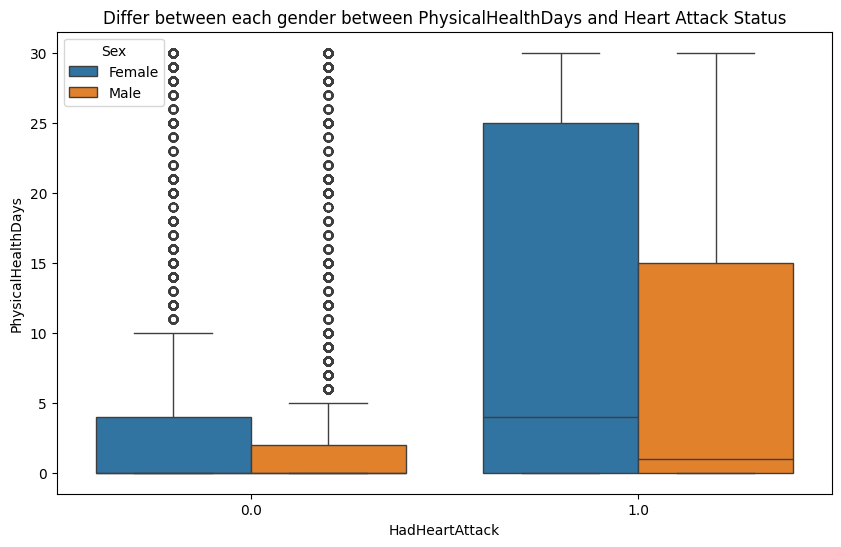

In [32]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='HadHeartAttack', y= 'PhysicalHealthDays', data=df, hue='Sex')
plt.title('Differ between each gender between PhysicalHealthDays and Heart Attack Status')
plt.ylabel('PhysicalHealthDays')
plt.xlabel('HadHeartAttack')
plt.show()

Q2 - check weather there a relation between heart attack & mental health days

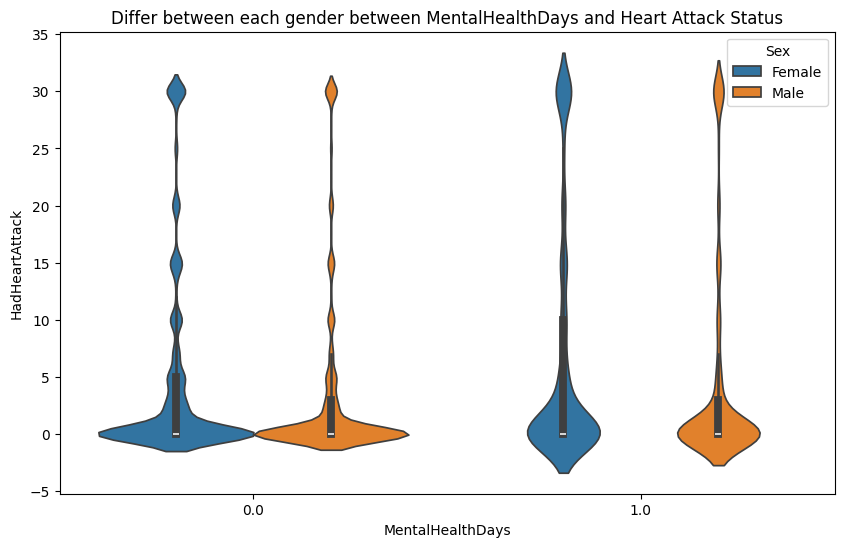

In [33]:
plt.figure(figsize=(10, 6))
sns.violinplot(x='HadHeartAttack', y= 'MentalHealthDays', data=df, hue='Sex')
plt.title('Differ between each gender between MentalHealthDays and Heart Attack Status')
plt.ylabel('HadHeartAttack')
plt.xlabel('MentalHealthDays')
plt.show()

Q3 - check weather there a relation between heart attack & weather he is somker or not

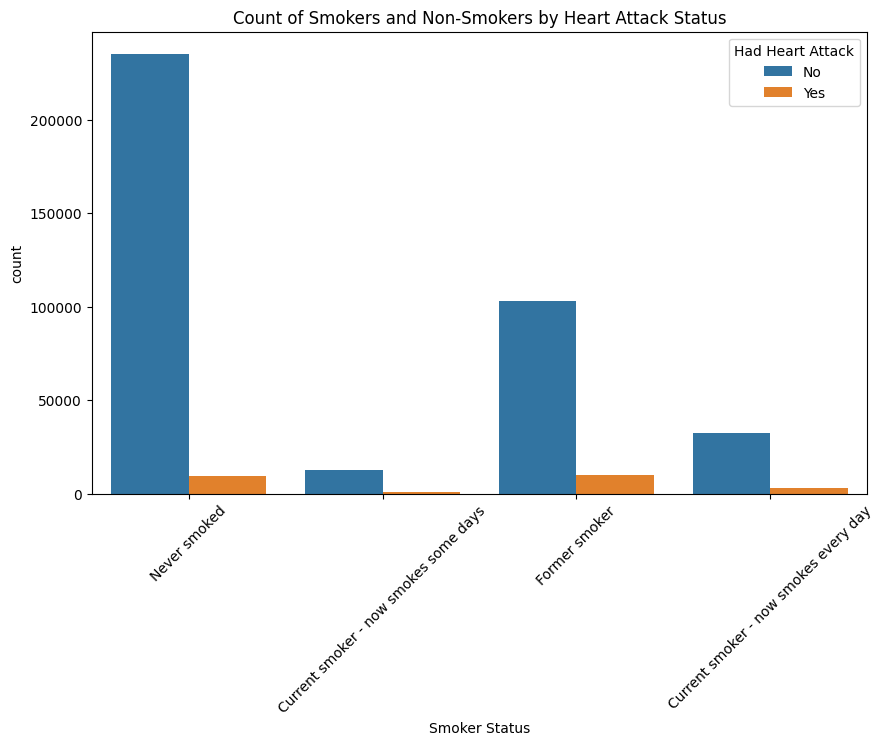

In [34]:
plt.figure(figsize=(10, 6))
sns.countplot(x='SmokerStatus', data=df, hue='HadHeartAttack')
plt.title('Count of Smokers and Non-Smokers by Heart Attack Status')
plt.xlabel('Smoker Status')
plt.xticks(rotation=45)
plt.legend(title='Had Heart Attack', labels=['No', 'Yes'])
plt.show()

Q4 - check the a relation between heart attack & weather he drinks alcohol or not?

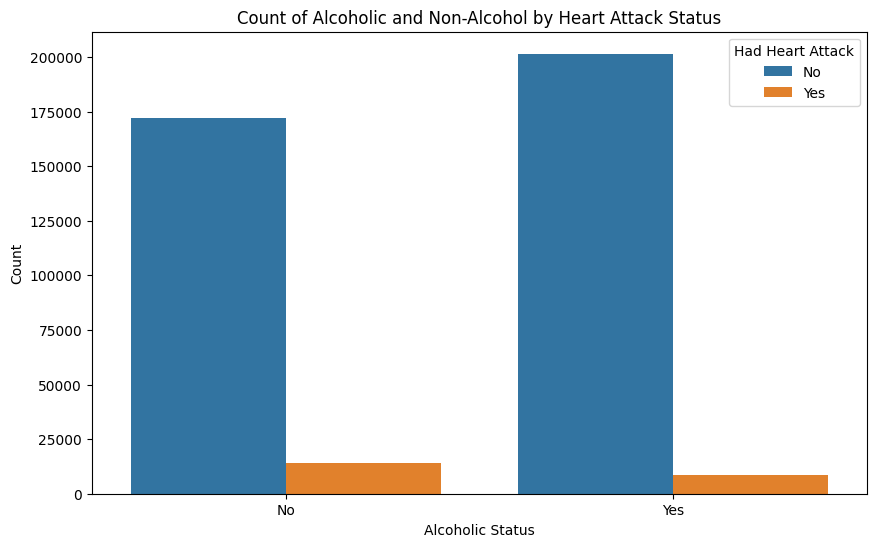

In [35]:
plt.figure(figsize=(10, 6))
sns.countplot(x='AlcoholDrinkers', data=df, hue='HadHeartAttack')
plt.title('Count of Alcoholic and Non-Alcohol by Heart Attack Status')
plt.ylabel('Count')
plt.xlabel('Alcoholic Status')
plt.legend(title='Had Heart Attack', labels=['No', 'Yes'])
plt.show()

Q5 - check the a relation between heart attack & BMI

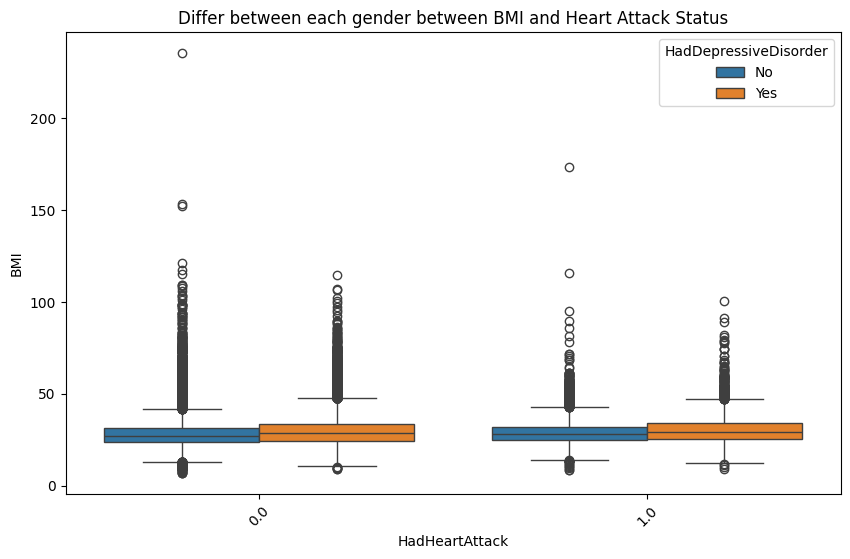

In [36]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='HadHeartAttack', y= 'BMI', data=df, hue='HadDepressiveDisorder')
plt.title('Differ between each gender between BMI and Heart Attack Status')
plt.ylabel('BMI')
plt.xlabel('HadHeartAttack')
plt.xticks(rotation=45)
plt.show()

Q6 - check the a relation between heart attack & chronic conditions

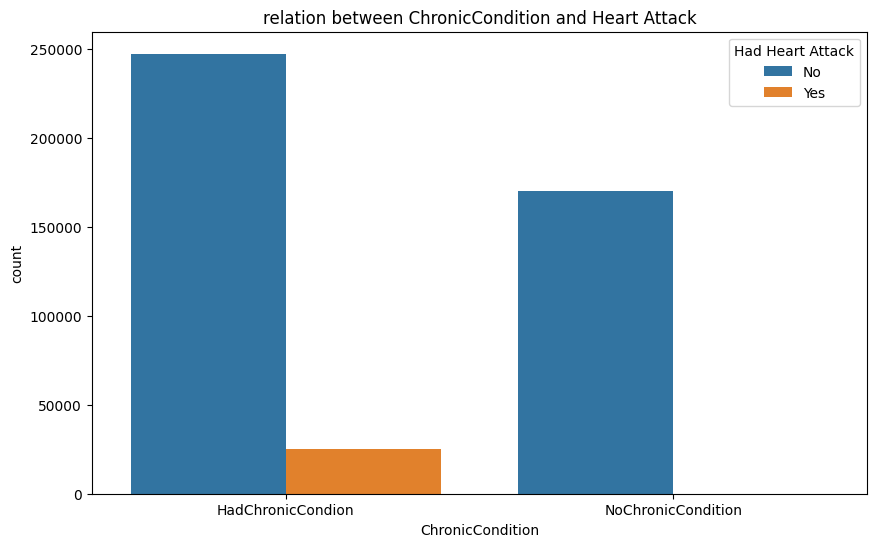

In [37]:
plt.figure(figsize=(10, 6))
sns.countplot(x='ChronicCondition', data=df, hue='HadHeartAttack')
plt.title('relation between ChronicCondition and Heart Attack')
plt.xlabel('ChronicCondition')
plt.legend(title='Had Heart Attack', labels=['No', 'Yes'])
plt.show()

Q7 - check the a relation between heart attack & age 

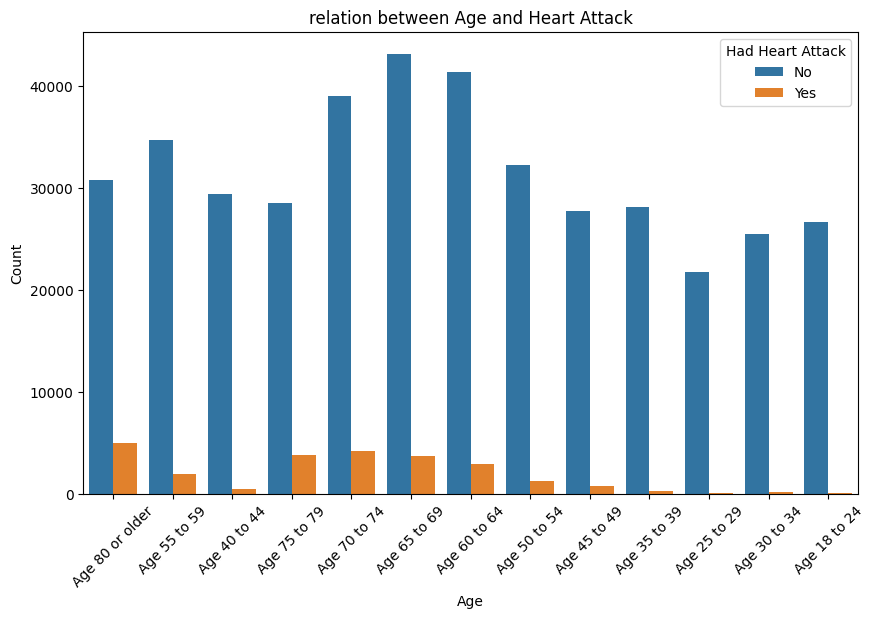

In [38]:
plt.figure(figsize=(10, 6))
sns.countplot(x='AgeCategory', data=df, hue='HadHeartAttack')
plt.title('relation between Age and Heart Attack')
plt.ylabel('Count')
plt.xlabel('Age')
plt.legend(title='Had Heart Attack', labels=['No', 'Yes'])
plt.xticks(rotation=45)
plt.show()

Q8 - check the a relation between heart attack & weather he had angia

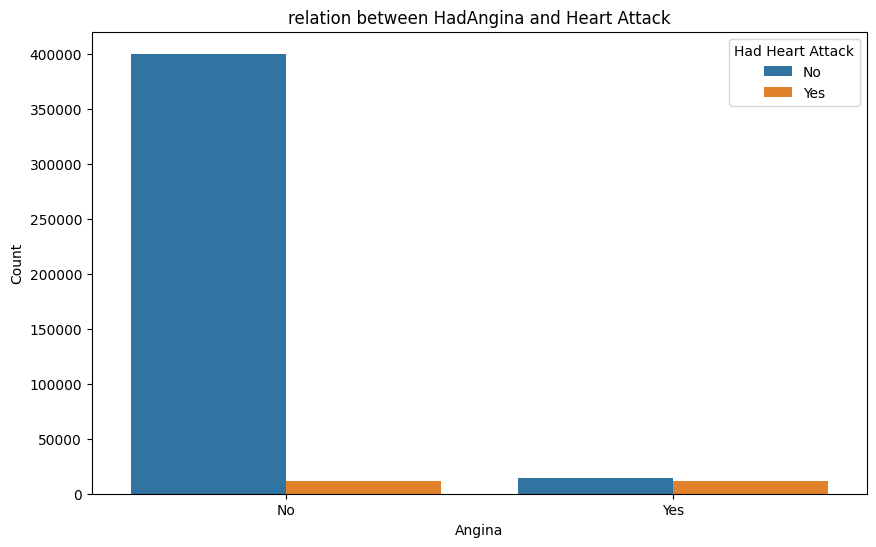

In [39]:
plt.figure(figsize=(10, 6))
sns.countplot(x='HadAngina', data=df, hue='HadHeartAttack')
plt.title('relation between HadAngina and Heart Attack')
plt.ylabel('Count')
plt.xlabel('Angina')
plt.legend(title='Had Heart Attack', labels=['No', 'Yes'])
plt.show()

Q9 - check the a relation between heart attack & weather he had diabiets

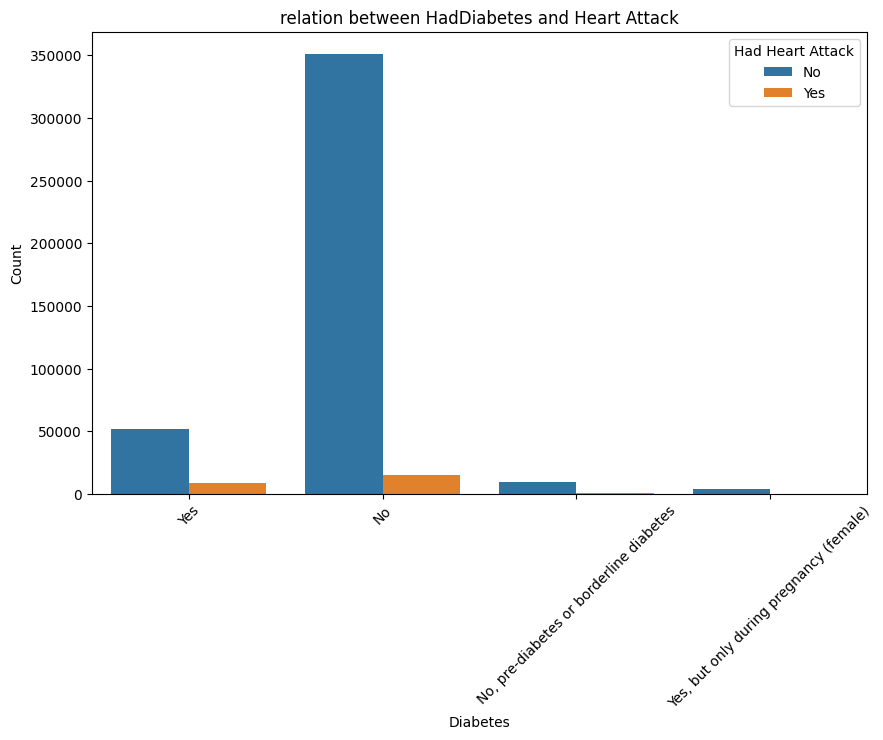

In [40]:
plt.figure(figsize=(10, 6))
sns.countplot(x='HadDiabetes', data=df, hue='HadHeartAttack')
plt.title('relation between HadDiabetes and Heart Attack')
plt.ylabel('Count')
plt.xlabel('Diabetes')
plt.legend(title='Had Heart Attack', labels=['No', 'Yes'])
plt.xticks(rotation=45)
plt.show()

Q10 - check the a relation between heart attack & weather he had strock

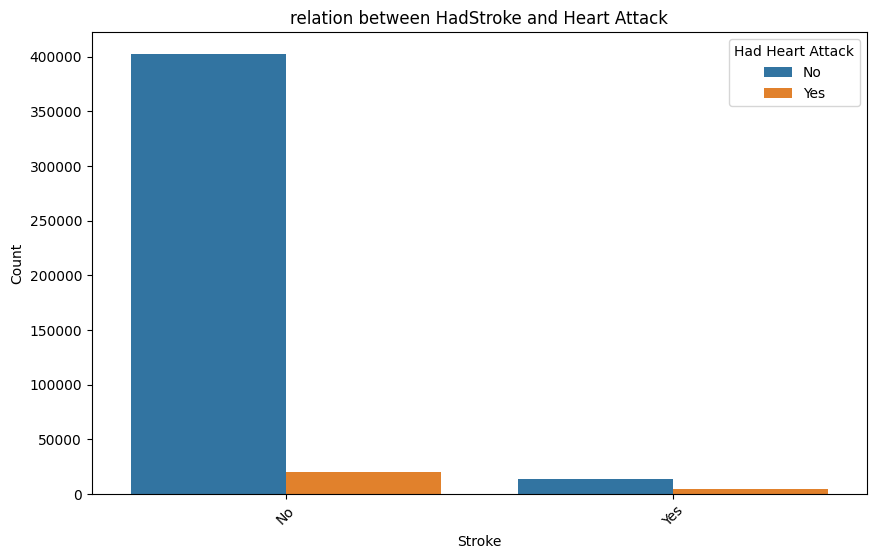

In [41]:
plt.figure(figsize=(10, 6))
sns.countplot(x='HadStroke', data=df, hue='HadHeartAttack')
plt.title('relation between HadStroke and Heart Attack')
plt.ylabel('Count')
plt.xlabel('Stroke')
plt.legend(title='Had Heart Attack', labels=['No', 'Yes'])
plt.xticks(rotation=45)
plt.show()

Q11 - check the a relation between heart attack & weather he had Covid or not

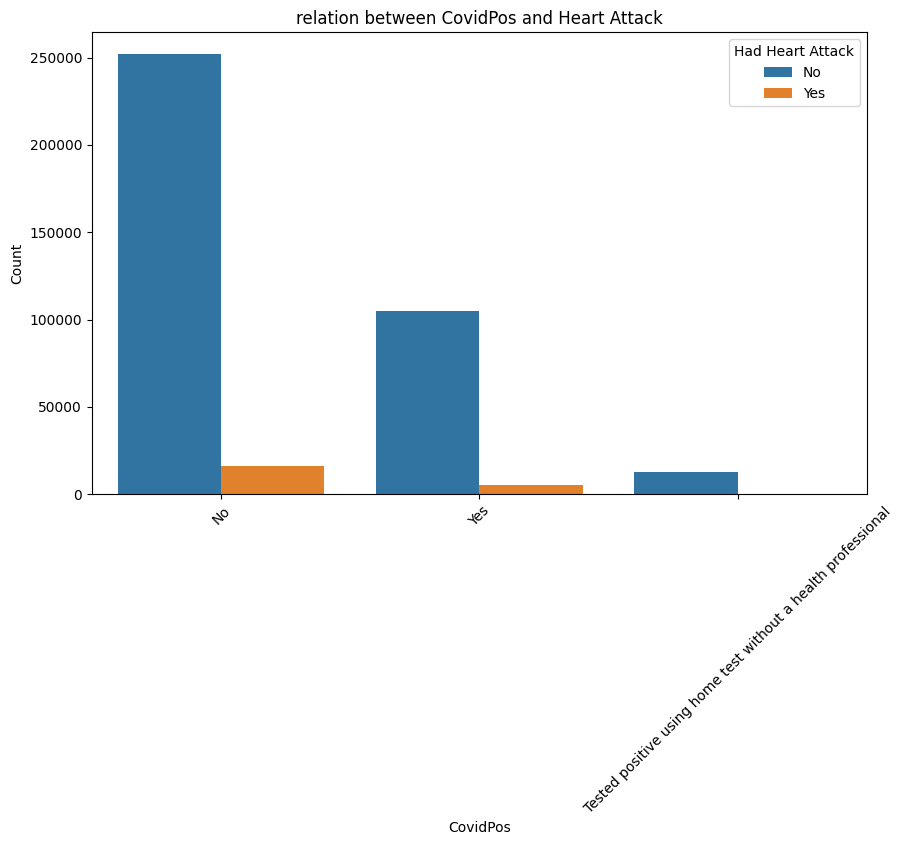

In [42]:
plt.figure(figsize=(10, 6))
sns.countplot(x='CovidPos', data=df, hue='HadHeartAttack')
plt.title('relation between CovidPos and Heart Attack')
plt.ylabel('Count')
plt.xlabel('CovidPos')
plt.legend(title='Had Heart Attack', labels=['No', 'Yes'])
plt.xticks(rotation=45)
plt.show()

Q12- check the a relation between heart attack & PhysicalActivities

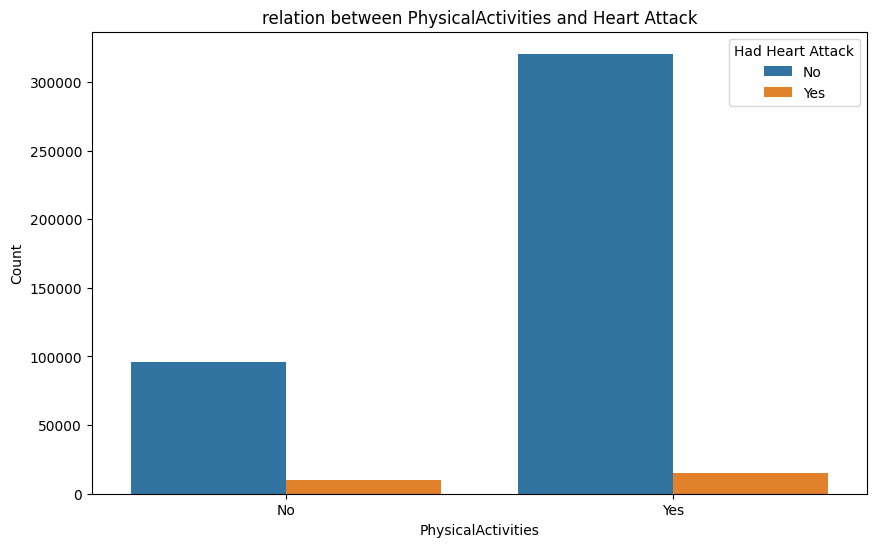

In [43]:
plt.figure(figsize=(10, 6))
sns.countplot(x='PhysicalActivities', data=df, hue='HadHeartAttack')
plt.title('relation between PhysicalActivities and Heart Attack')
plt.ylabel('Count')
plt.xlabel('PhysicalActivities')
plt.legend(title='Had Heart Attack', labels=['No', 'Yes'])
plt.show()

Q13- check the a relation between heart attack & GeneralHealth

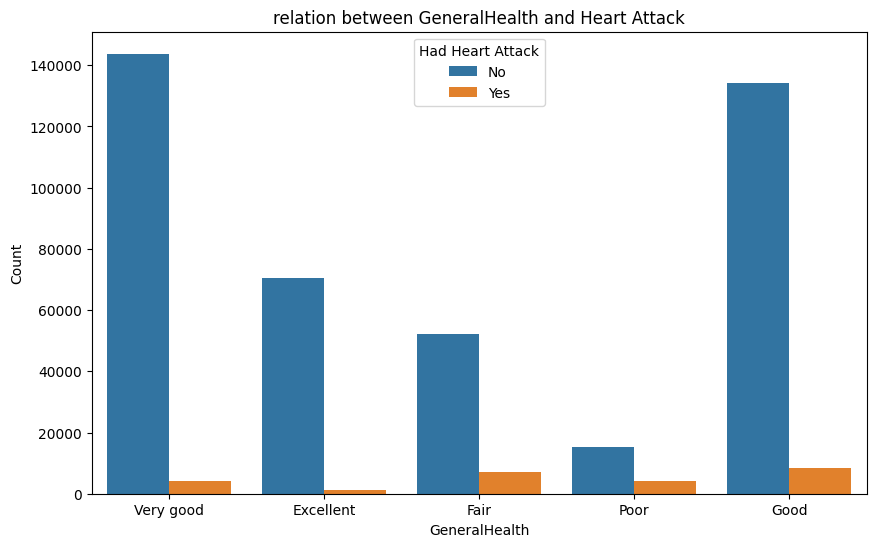

In [44]:
plt.figure(figsize=(10, 6))
sns.countplot(x='GeneralHealth', data=df, hue='HadHeartAttack')
plt.title('relation between GeneralHealth and Heart Attack')
plt.ylabel('Count')
plt.xlabel('GeneralHealth')
plt.legend(title='Had Heart Attack', labels=['No', 'Yes'])
plt.show()

Q14- check the a relation between sleep time & GeneralHealth

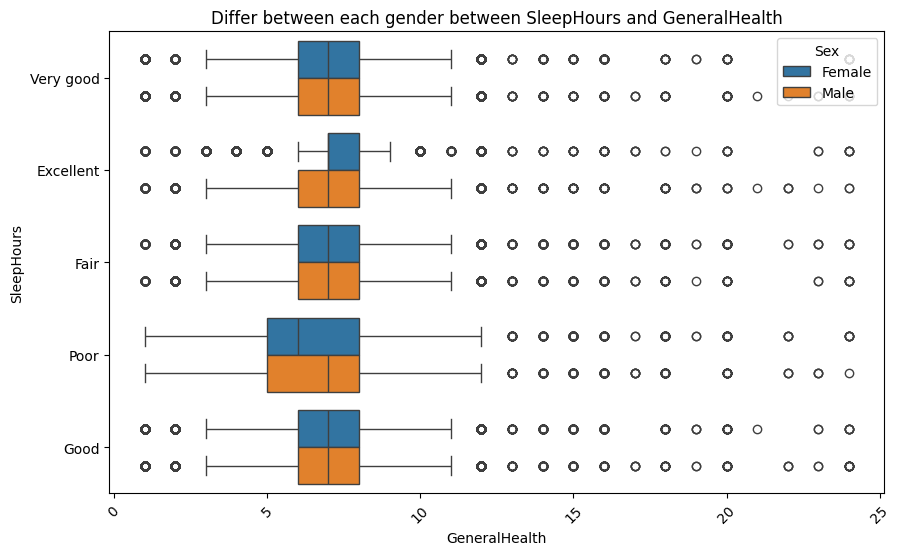

In [45]:
plt.figure(figsize=(10, 6))
sns.boxplot(x=df['SleepHours'], y=df['GeneralHealth'], hue=df['Sex'])
plt.title('Differ between each gender between SleepHours and GeneralHealth')
plt.ylabel('SleepHours')
plt.xlabel('GeneralHealth')
plt.xticks(rotation=45)
plt.show()

Q15- check the a relation between sleep time & BMI

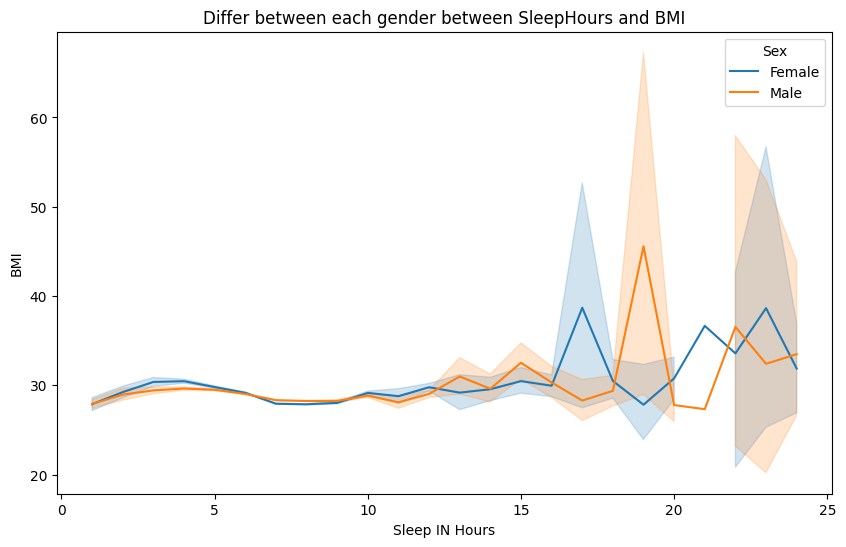

In [46]:
plt.figure(figsize=(10, 6))
sns.lineplot(x=df['SleepHours'], y=df['BMI'], hue=df['Sex'])
plt.title('Differ between each gender between SleepHours and BMI')
plt.xlabel('Sleep IN Hours')
plt.ylabel('BMI')
plt.show()

Q16 - check the a relation between sleep time & WeightInKilograms

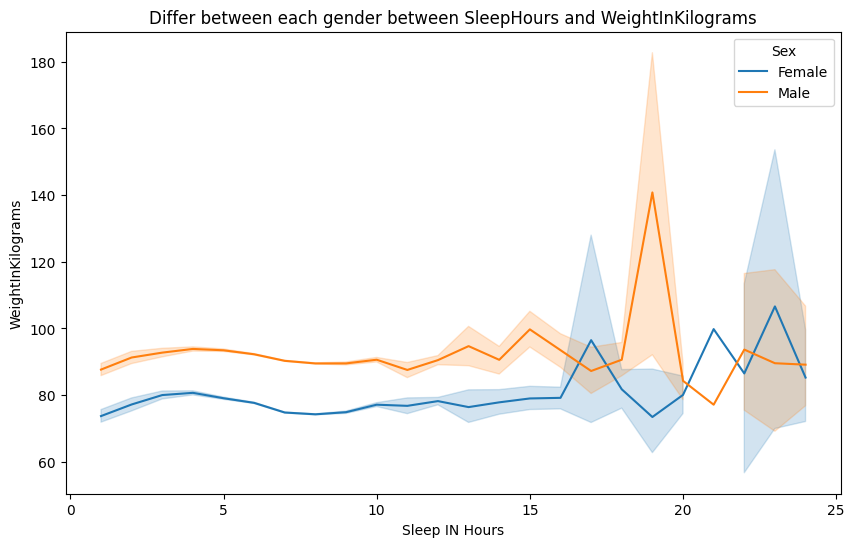

In [47]:
plt.figure(figsize=(10, 6))
sns.lineplot(x=df['SleepHours'], y=df['WeightInKilograms'], hue=df['Sex'])
plt.title('Differ between each gender between SleepHours and WeightInKilograms')
plt.xlabel('Sleep IN Hours')
plt.ylabel('WeightInKilograms')
plt.show()

Q17 - check the a relation between GeneralHealth & ChronicCondition

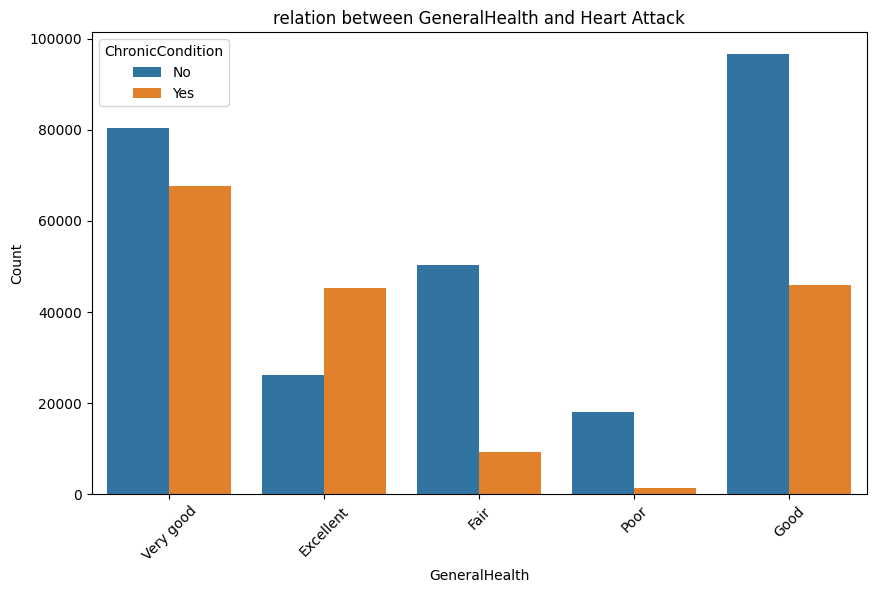

In [48]:
plt.figure(figsize=(10, 6))
sns.countplot(x='GeneralHealth', data=df, hue='ChronicCondition')
plt.title('relation between GeneralHealth and Heart Attack')
plt.ylabel('Count')
plt.xlabel('GeneralHealth')
plt.legend(title='ChronicCondition', labels=['No', 'Yes'])
plt.xticks(rotation=45)
plt.show()

Q18 - check the a relation between HealthScore & SleepHours

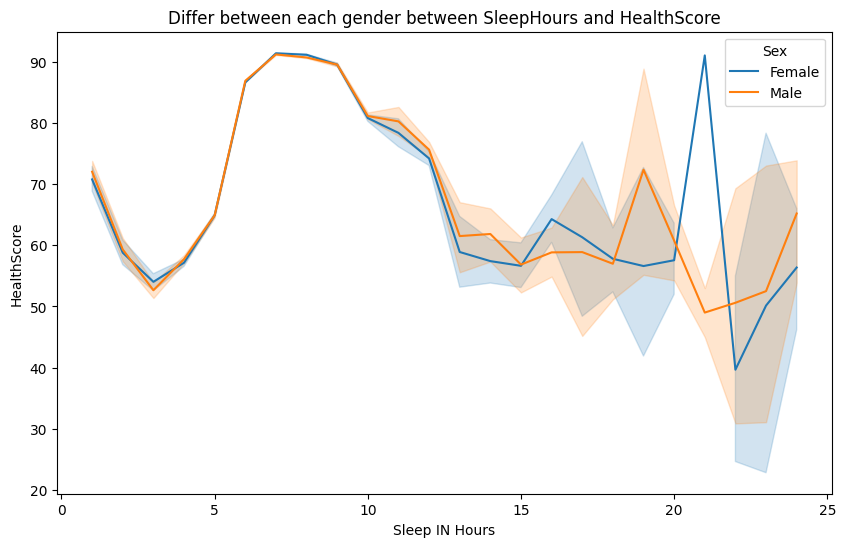

In [49]:
plt.figure(figsize=(10, 6))
sns.lineplot(x=df['SleepHours'], y=df['HealthScore'], hue=df['Sex'])
plt.title('Differ between each gender between SleepHours and HealthScore')
plt.xlabel('Sleep IN Hours')
plt.ylabel('HealthScore')
plt.show()

Multi-Variate Analysis

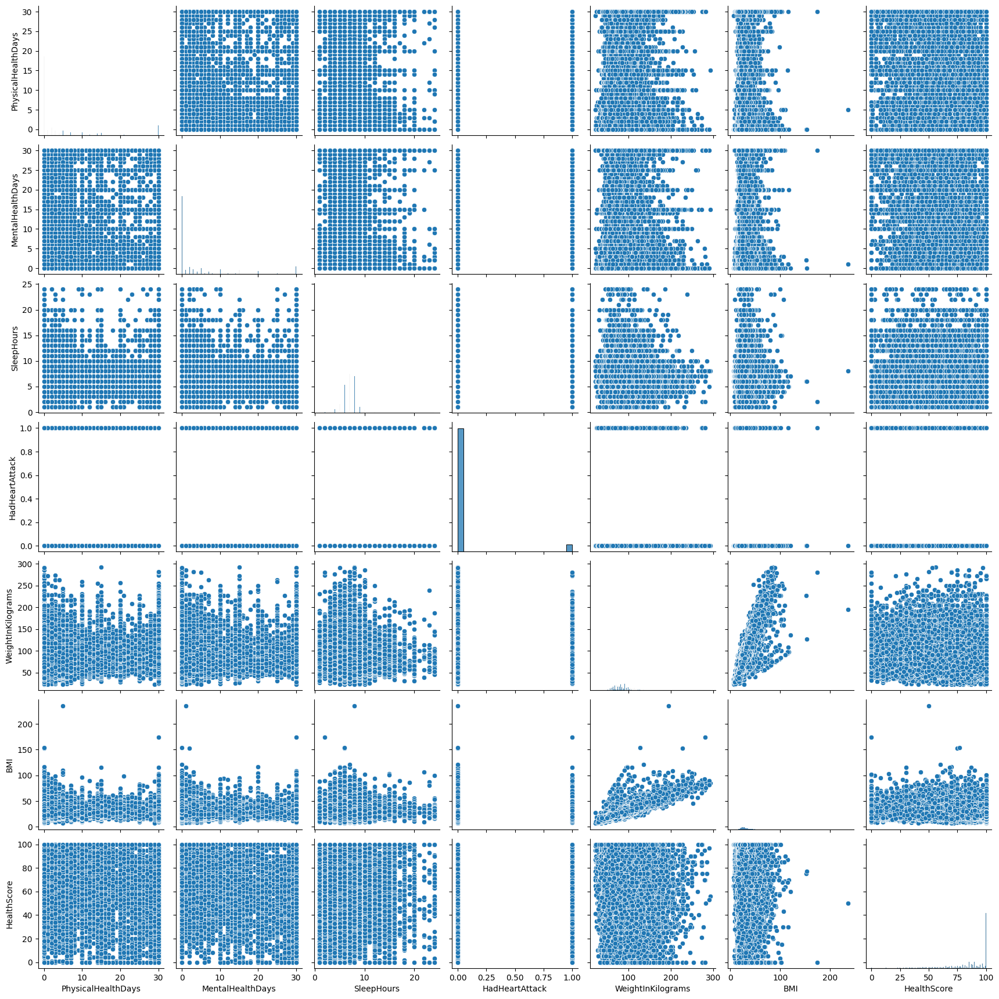

In [50]:
sns.pairplot(df)

Pre-Processing
* a) Detect & Handle Duplicates
* b) train_test_split
* c) Detect & Handle NaNs
* d) Detect & Handle Outliers
* e) Encoding: (Ordinal:[OrdinalEncoder, LabelEncoder] - Nominal: [< 7 uniques(OneHotEncoding), > 7 uniques (BinaryEncoder)])
* f) Imbalanced: X_train_resampled
* g) Scaling: StandardScaler, MinMaxScaler, RobustScaler: X_train_resampled_scaled

a) Detect & Handle Duplicates

In [51]:
df.duplicated().sum()

4505

In [52]:
df.drop_duplicates(inplace = True)
df.reset_index(inplace= True, drop= True)

b) train_test_split

In [54]:
X = df.drop('HadHeartAttack', axis=1)
y = df['HadHeartAttack']

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size= 0.2, shuffle=True, random_state=42, stratify=y)

In [55]:
print("Original class distribution:")
print(y.value_counts(normalize=True))

# Training set distribution
print("\nTraining set class distribution:")
print(y_train.value_counts(normalize=True))

# Test set distribution
print("\nTest set class distribution:")
print(y_test.value_counts(normalize=True))


Original class distribution:
HadHeartAttack
0.0    0.942632
1.0    0.057368
Name: proportion, dtype: float64

Training set class distribution:
HadHeartAttack
0.0    0.942631
1.0    0.057369
Name: proportion, dtype: float64

Test set class distribution:
HadHeartAttack
0.0    0.942637
1.0    0.057363
Name: proportion, dtype: float64


c- Detect and handle nans

In [56]:
X_train.isna().sum()

Sex                          0
GeneralHealth              846
PhysicalHealthDays        8433
MentalHealthDays          7057
LastCheckupTime           6371
PhysicalActivities         776
SleepHours                4159
HadAngina                 2869
HadStroke                  848
HadAsthma                 1120
HadSkinCancer             2194
HadCOPD                   1481
HadDepressiveDisorder     1947
HadKidneyDisease          1266
HadArthritis              1843
HadDiabetes                653
SmokerStatus             24487
ECigaretteUsage          24662
ChestScan                40764
AgeCategory               6667
WeightInKilograms        29673
AlcoholDrinkers          33268
HIVTesting               48873
FluVaxLast12             33738
PneumoVaxEver            57459
TetanusLast10Tdap        61678
HighRiskLastYear         36522
CovidPos                 36616
BMI                      33233
ChronicCondition             0
HealthScore                  0
dtype: int64

In [57]:
retained_indices = X_train.dropna(thresh=len(X_train.columns) - 10).index

X_train = X_train.loc[retained_indices]
y_train = y_train.loc[retained_indices]


In [58]:
X_train.isna().sum()

Sex                          0
GeneralHealth              748
PhysicalHealthDays        7498
MentalHealthDays          6296
LastCheckupTime           5715
PhysicalActivities         673
SleepHours                3655
HadAngina                 2649
HadStroke                  775
HadAsthma                 1023
HadSkinCancer             2016
HadCOPD                   1326
HadDepressiveDisorder     1724
HadKidneyDisease          1132
HadArthritis              1665
HadDiabetes                557
SmokerStatus             10762
ECigaretteUsage          10789
ChestScan                26727
AgeCategory               5448
WeightInKilograms        17657
AlcoholDrinkers          19217
HIVTesting               34817
FluVaxLast12             19681
PneumoVaxEver            43401
TetanusLast10Tdap        47614
HighRiskLastYear         22477
CovidPos                 22561
BMI                      20447
ChronicCondition             0
HealthScore                  0
dtype: int64

In [59]:
knn_imputer = KNNImputer(n_neighbors=3)
X_train[['PhysicalHealthDays', 'MentalHealthDays', 'SleepHours']] = knn_imputer.fit_transform(X_train[['PhysicalHealthDays', 'MentalHealthDays', 'SleepHours']])
X_test[['PhysicalHealthDays', 'MentalHealthDays', 'SleepHours']] = knn_imputer.transform(X_test[['PhysicalHealthDays', 'MentalHealthDays', 'SleepHours']])

In [60]:
median_imputer = SimpleImputer(strategy='median')
X_train[['WeightInKilograms', 'BMI']] = median_imputer.fit_transform(X_train[['WeightInKilograms', 'BMI']])
X_test[['WeightInKilograms', 'BMI']] = median_imputer.transform(X_test[['WeightInKilograms', 'BMI']])

In [61]:
X_train.isna().sum()

Sex                          0
GeneralHealth              748
PhysicalHealthDays           0
MentalHealthDays             0
LastCheckupTime           5715
PhysicalActivities         673
SleepHours                   0
HadAngina                 2649
HadStroke                  775
HadAsthma                 1023
HadSkinCancer             2016
HadCOPD                   1326
HadDepressiveDisorder     1724
HadKidneyDisease          1132
HadArthritis              1665
HadDiabetes                557
SmokerStatus             10762
ECigaretteUsage          10789
ChestScan                26727
AgeCategory               5448
WeightInKilograms            0
AlcoholDrinkers          19217
HIVTesting               34817
FluVaxLast12             19681
PneumoVaxEver            43401
TetanusLast10Tdap        47614
HighRiskLastYear         22477
CovidPos                 22561
BMI                          0
ChronicCondition             0
HealthScore                  0
dtype: int64

In [62]:
col_have_small_nans = ['PhysicalActivities', 'GeneralHealth', 'HadStroke', 'HadDiabetes',
        'HadAsthma', 'HadSkinCancer', 'HadCOPD', 'HadDepressiveDisorder',
        'HadKidneyDisease', 'HadArthritis']
nan_index = X_train[X_train[col_have_small_nans].isna().any(axis=1)].index

X_train = X_train.drop(nan_index)
y_train = y_train.drop(nan_index)

In [63]:
mode_imputer = SimpleImputer(strategy='most_frequent')

X_train[['LastCheckupTime', 'HadAngina',
        'SmokerStatus', 'ECigaretteUsage',
        'ChestScan', 'AgeCategory', 'AlcoholDrinkers', 'HIVTesting',
        'FluVaxLast12', 'PneumoVaxEver', 'TetanusLast10Tdap',
        'HighRiskLastYear', 'CovidPos', 'ChronicCondition',
        'PhysicalActivities', 'GeneralHealth', 'HadStroke', 'HadDiabetes',
        'HadAsthma', 'HadSkinCancer', 'HadCOPD', 'HadDepressiveDisorder',
        'HadKidneyDisease', 'HadArthritis']] = mode_imputer.fit_transform(X_train[['LastCheckupTime', 'HadAngina','SmokerStatus', 'ECigaretteUsage','ChestScan', 'AgeCategory', 'AlcoholDrinkers', 'HIVTesting','FluVaxLast12', 'PneumoVaxEver', 'TetanusLast10Tdap','HighRiskLastYear', 'CovidPos', 'ChronicCondition', 'PhysicalActivities', 'GeneralHealth', 'HadStroke', 'HadDiabetes','HadAsthma', 'HadSkinCancer', 'HadCOPD', 'HadDepressiveDisorder','HadKidneyDisease', 'HadArthritis']])

X_test[['LastCheckupTime', 'HadAngina',
        'SmokerStatus', 'ECigaretteUsage',
        'ChestScan', 'AgeCategory', 'AlcoholDrinkers', 'HIVTesting',
        'FluVaxLast12', 'PneumoVaxEver', 'TetanusLast10Tdap',
        'HighRiskLastYear', 'CovidPos', 'ChronicCondition',
        'PhysicalActivities', 'GeneralHealth', 'HadStroke', 'HadDiabetes',
        'HadAsthma', 'HadSkinCancer', 'HadCOPD', 'HadDepressiveDisorder',
        'HadKidneyDisease', 'HadArthritis']] = mode_imputer.transform(X_test[['LastCheckupTime', 'HadAngina','SmokerStatus', 'ECigaretteUsage','ChestScan', 'AgeCategory', 'AlcoholDrinkers', 'HIVTesting','FluVaxLast12', 'PneumoVaxEver', 'TetanusLast10Tdap','HighRiskLastYear', 'CovidPos', 'ChronicCondition', 'PhysicalActivities', 'GeneralHealth', 'HadStroke', 'HadDiabetes','HadAsthma', 'HadSkinCancer', 'HadCOPD', 'HadDepressiveDisorder','HadKidneyDisease', 'HadArthritis']])

In [64]:
X_test.isna().sum()

Sex                      0
GeneralHealth            0
PhysicalHealthDays       0
MentalHealthDays         0
LastCheckupTime          0
PhysicalActivities       0
SleepHours               0
HadAngina                0
HadStroke                0
HadAsthma                0
HadSkinCancer            0
HadCOPD                  0
HadDepressiveDisorder    0
HadKidneyDisease         0
HadArthritis             0
HadDiabetes              0
SmokerStatus             0
ECigaretteUsage          0
ChestScan                0
AgeCategory              0
WeightInKilograms        0
AlcoholDrinkers          0
HIVTesting               0
FluVaxLast12             0
PneumoVaxEver            0
TetanusLast10Tdap        0
HighRiskLastYear         0
CovidPos                 0
BMI                      0
ChronicCondition         0
HealthScore              0
dtype: int64

D- Detect & Handle Outliers

In [65]:
# 'PhysicalHealthDays', 'MentalHealthDays', 'SleepHours', 'WeightInKilograms', 'BMI', 'HealthScore'
# the above are the numeric columns have ouliers but
        # ('PhysicalHealthDays', 'MentalHealthDays', 'SleepHours') 
        # represent a categorical mean ex 2 bad mental health days etc

In [66]:
X_train[['WeightInKilograms_loged', 'BMI']] = X_train[['WeightInKilograms', 'BMI']].apply(np.log1p)
X_test[['WeightInKilograms_loged', 'BMI']] = X_test[['WeightInKilograms', 'BMI']].apply(np.log1p)

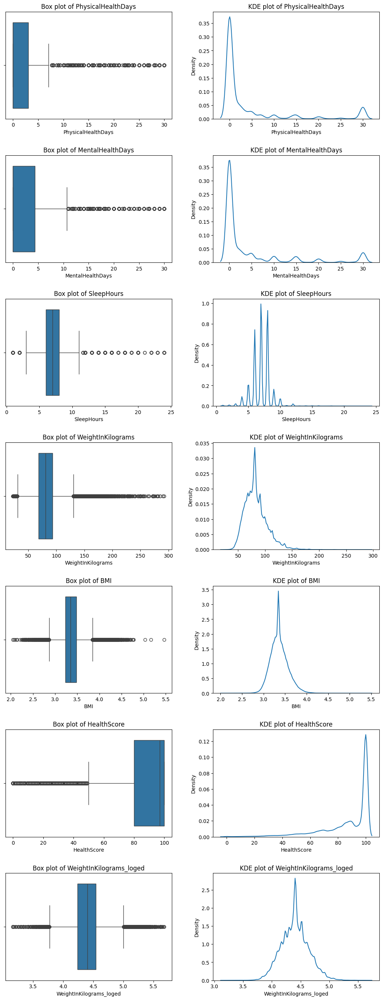

In [67]:
num_col = X_train.select_dtypes(include='number').columns
fig, axes = plt.subplots(nrows=len(num_col), ncols=2, figsize=(12, len(num_col) * 4))
fig.tight_layout(pad=5.0)

for i, col in enumerate(num_col):
    # Box plot
    sns.boxplot(x=X_train[col], ax=axes[i, 0])
    axes[i, 0].set_title(f'Box plot of {col}')
    
    # KDE plot
    sns.kdeplot(x=X_train[col], ax=axes[i, 1])
    axes[i, 1].set_title(f'KDE plot of {col}')


E- Encoding: (Ordinal:[OrdinalEncoder, LabelEncoder] - Nominal: [< 7 uniques(OneHotEncoding), > 7 uniques (BinaryEncoder)])

In [68]:
dff = df[['GeneralHealth', 'SmokerStatus', 'ECigaretteUsage','AlcoholDrinkers']]

# Describe Cat columns

cat_cols = dff.select_dtypes(include="O").columns
for col in cat_cols:
    print(f"number of uniques of \'{col}\': {dff[col].nunique()}")
    print(f"uniques of \'{col}\': {dff[col].unique()}")
    print()
    print("*" * 50)
    print()


number of uniques of 'GeneralHealth': 5
uniques of 'GeneralHealth': ['Very good' 'Excellent' 'Fair' 'Poor' 'Good' nan]

**************************************************

number of uniques of 'SmokerStatus': 4
uniques of 'SmokerStatus': ['Never smoked' 'Current smoker - now smokes some days' 'Former smoker'
 nan 'Current smoker - now smokes every day']

**************************************************

number of uniques of 'ECigaretteUsage': 4
uniques of 'ECigaretteUsage': ['Not at all (right now)' 'Never used e-cigarettes in my entire life' nan
 'Use them every day' 'Use them some days']

**************************************************

number of uniques of 'AlcoholDrinkers': 2
uniques of 'AlcoholDrinkers': ['No' 'Yes' nan]

**************************************************



In [69]:
#orderencoder  = 'GeneralHealth', 'SmokerStatus', 'ECigaretteUsage','AlcoholDrinkers', 

#OHE = 'Sex', 'LastCheckupTime', 'PhysicalActivities', 
    #  'HadAngina', 'HadStroke', 'HadAsthma', 'HadSkinCancer', 'HadCOPD',
    #  'HadDepressiveDisorder', 'HadKidneyDisease', 'HadArthritis',
    #  'HadDiabetes', 'ChestScan', 'HighRiskLastYear', 'CovidPos',
    #  'ChronicCondition', 'HIVTesting', 'FluVaxLast12', 'PneumoVaxEver', 'TetanusLast10Tdap'

#binary encoder: 'AgeCategory'
X_train.select_dtypes(include='O').columns

Index(['Sex', 'GeneralHealth', 'LastCheckupTime', 'PhysicalActivities',
       'HadAngina', 'HadStroke', 'HadAsthma', 'HadSkinCancer', 'HadCOPD',
       'HadDepressiveDisorder', 'HadKidneyDisease', 'HadArthritis',
       'HadDiabetes', 'SmokerStatus', 'ECigaretteUsage', 'ChestScan',
       'AgeCategory', 'AlcoholDrinkers', 'HIVTesting', 'FluVaxLast12',
       'PneumoVaxEver', 'TetanusLast10Tdap', 'HighRiskLastYear', 'CovidPos',
       'ChronicCondition'],
      dtype='object')

In [70]:
oht_encoder = OneHotEncoder(sparse_output=False, drop='first')
oht_encoder_train_df = oht_encoder.fit_transform(X_train[['Sex', 'LastCheckupTime', 'PhysicalActivities', 
                                          'HadAngina', 'HadStroke', 'HadAsthma', 'HadSkinCancer', 'HadCOPD',
                                          'HadDepressiveDisorder', 'HadKidneyDisease', 'HadArthritis',
                                          'HadDiabetes', 'ChestScan', 'HighRiskLastYear', 'CovidPos',
                                          'ChronicCondition', 'HIVTesting', 'FluVaxLast12',
                                          'PneumoVaxEver', 'TetanusLast10Tdap' ]])
oht_encoder_train_df = pd.DataFrame(oht_encoder_train_df, columns=oht_encoder.get_feature_names_out(), index=X_train.index)

oht_encoder_test_df = oht_encoder.transform(X_test[['Sex', 'LastCheckupTime', 'PhysicalActivities', 
                                          'HadAngina', 'HadStroke', 'HadAsthma', 'HadSkinCancer', 'HadCOPD',
                                          'HadDepressiveDisorder', 'HadKidneyDisease', 'HadArthritis',
                                          'HadDiabetes', 'ChestScan', 'HighRiskLastYear', 'CovidPos',
                                          'ChronicCondition', 'HIVTesting', 'FluVaxLast12',
                                          'PneumoVaxEver', 'TetanusLast10Tdap' ]])
oht_encoder_test_df = pd.DataFrame(oht_encoder_test_df, columns=oht_encoder.get_feature_names_out(), index=X_test.index)
oht_encoder_train_df

,Sex_Male,LastCheckupTime_Within past 2 years (1 year but less than 2 years ago),LastCheckupTime_Within past 5 years (2 years but less than 5 years ago),LastCheckupTime_Within past year (anytime less than 12 months ago),PhysicalActivities_Yes,HadAngina_Yes,HadStroke_Yes,HadAsthma_Yes,HadSkinCancer_Yes,HadCOPD_Yes,...,HighRiskLastYear_Yes,CovidPos_Tested positive using home test without a health professional,CovidPos_Yes,ChronicCondition_NoChronicCondition,HIVTesting_Yes,FluVaxLast12_Yes,PneumoVaxEver_Yes,"TetanusLast10Tdap_Yes, received Tdap","TetanusLast10Tdap_Yes, received tetanus shot but not sure what type","TetanusLast10Tdap_Yes, received tetanus shot, but not Tdap"
27989,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
166558,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
322196,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
318756,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0
165909,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
156151,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0
160033,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
260567,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0
162131,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0


In [71]:
categories = [
    ['Poor', 'Fair', 'Good', 'Very good', 'Excellent'],  
    ['Current smoker - now smokes every day', 
     'Current smoker - now smokes some days', 
     'Former smoker', 
     'Never smoked'], 
    ['Use them every day', 
     'Use them some days', 
     'Not at all (right now)', 
     'Never used e-cigarettes in my entire life'],
    ['Yes', 'No'],
]
order_encoder = OrdinalEncoder(categories=categories)
order_encoder_train_df = order_encoder.fit_transform(X_train[['GeneralHealth', 'SmokerStatus', 'ECigaretteUsage','AlcoholDrinkers']])
order_encoder_train_df = pd.DataFrame(order_encoder_train_df, columns=order_encoder.get_feature_names_out(
    input_features=['GeneralHealth', 'SmokerStatus', 'ECigaretteUsage','AlcoholDrinkers']), index=X_train.index)

order_encoder_test_df = order_encoder.transform(X_test[['GeneralHealth', 'SmokerStatus', 'ECigaretteUsage','AlcoholDrinkers']])
order_encoder_test_df = pd.DataFrame(order_encoder_test_df, columns=order_encoder.get_feature_names_out(
    input_features=['GeneralHealth', 'SmokerStatus', 'ECigaretteUsage','AlcoholDrinkers']), index=X_test.index)
order_encoder_test_df

,GeneralHealth,SmokerStatus,ECigaretteUsage,AlcoholDrinkers
144309,3.0,2.0,3.0,1.0
44891,3.0,3.0,3.0,0.0
179729,0.0,3.0,2.0,1.0
182569,4.0,3.0,3.0,1.0
166637,3.0,3.0,3.0,0.0
...,...,...,...,...
121196,4.0,3.0,2.0,0.0
293986,4.0,2.0,3.0,0.0
135355,3.0,3.0,3.0,0.0
368901,2.0,2.0,2.0,0.0


In [72]:
bn_encoder = BinaryEncoder()
bn_encoder_train_df = bn_encoder.fit_transform(X_train['AgeCategory'])
bn_encoder_test_df = bn_encoder.transform(X_test['AgeCategory'])

In [82]:
bn_encoder_train_df

,AgeCategory_0,AgeCategory_1,AgeCategory_2,AgeCategory_3
27989,0,0,0,1
166558,0,0,1,0
322196,0,0,1,1
318756,0,1,0,0
165909,0,1,0,1
...,...,...,...,...
156151,1,0,1,1
160033,0,1,1,1
260567,0,1,0,1
162131,1,0,0,1


In [73]:
X_train = X_train.drop(columns=['GeneralHealth', 'AgeCategory', 'TetanusLast10Tdap', 'LastCheckupTime', 
                                'PhysicalActivities', 'SmokerStatus', 'ECigaretteUsage', 'AlcoholDrinkers', 
                                'HIVTesting', 'FluVaxLast12', 'PneumoVaxEver','Sex', 'HadAngina', 'HadStroke', 'HadAsthma',
                                'HadSkinCancer', 'HadCOPD', 'HadDepressiveDisorder',
                                'HadKidneyDisease', 'HadArthritis', 'HadDiabetes', 
                                'ChestScan', 'HighRiskLastYear', 'CovidPos',
                                'ChronicCondition'])
X_train = pd.concat([X_train, order_encoder_train_df, oht_encoder_train_df, bn_encoder_train_df], axis=1)

X_test = X_test.drop(columns=['GeneralHealth', 'AgeCategory', 'TetanusLast10Tdap', 'LastCheckupTime', 
                                'PhysicalActivities', 'SmokerStatus', 'ECigaretteUsage', 'AlcoholDrinkers', 
                                'HIVTesting', 'FluVaxLast12', 'PneumoVaxEver','Sex', 'HadAngina', 'HadStroke', 'HadAsthma',
                                'HadSkinCancer', 'HadCOPD', 'HadDepressiveDisorder',
                                'HadKidneyDisease', 'HadArthritis', 'HadDiabetes', 
                                'ChestScan', 'HighRiskLastYear', 'CovidPos',
                                'ChronicCondition'])
X_test = pd.concat([X_test, order_encoder_test_df, oht_encoder_test_df, bn_encoder_test_df], axis=1)


In [74]:
X_train

,PhysicalHealthDays,MentalHealthDays,SleepHours,WeightInKilograms,BMI,HealthScore,WeightInKilograms_loged,GeneralHealth,SmokerStatus,ECigaretteUsage,...,HIVTesting_Yes,FluVaxLast12_Yes,PneumoVaxEver_Yes,"TetanusLast10Tdap_Yes, received Tdap","TetanusLast10Tdap_Yes, received tetanus shot but not sure what type","TetanusLast10Tdap_Yes, received tetanus shot, but not Tdap",AgeCategory_0,AgeCategory_1,AgeCategory_2,AgeCategory_3
27989,12.0,30.0,7.0,158.76,3.858351,35,5.073673,1.0,2.0,3.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0,0,0,1
166558,3.0,10.0,5.0,90.72,3.443993,73,4.518740,1.0,3.0,3.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0,0,1,0
322196,0.0,0.0,8.0,80.74,3.345531,100,4.403543,2.0,3.0,3.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0,0,1,1
318756,0.0,5.0,6.0,90.72,3.367296,100,4.518740,3.0,3.0,3.0,...,1.0,0.0,1.0,0.0,1.0,0.0,0,1,0,0
165909,0.0,0.0,3.0,72.57,3.343349,100,4.298237,4.0,3.0,3.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
156151,30.0,4.0,8.0,99.79,3.725317,72,4.613039,1.0,2.0,3.0,...,0.0,1.0,1.0,0.0,1.0,0.0,1,0,1,1
160033,0.0,0.0,7.0,86.18,3.394334,100,4.467975,1.0,2.0,2.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0,1,1,1
260567,0.0,0.0,7.0,68.04,3.281242,100,4.234686,3.0,3.0,3.0,...,1.0,1.0,1.0,0.0,1.0,0.0,0,1,0,1
162131,0.0,0.0,16.0,115.67,3.657641,96,4.759349,4.0,3.0,3.0,...,0.0,1.0,0.0,1.0,0.0,0.0,1,0,0,1


* f) Imbalanced: X_train_resampled

In [75]:
y_train.value_counts()

HadHeartAttack
0.0    307339
1.0     18146
Name: count, dtype: int64

In [76]:
print(X_train.shape)
print(y_train.shape)

(325485, 42)
(325485,)


In [77]:
smote = SMOTE(k_neighbors=5, random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)
X_train_resampled

,PhysicalHealthDays,MentalHealthDays,SleepHours,WeightInKilograms,BMI,HealthScore,WeightInKilograms_loged,GeneralHealth,SmokerStatus,ECigaretteUsage,...,HIVTesting_Yes,FluVaxLast12_Yes,PneumoVaxEver_Yes,"TetanusLast10Tdap_Yes, received Tdap","TetanusLast10Tdap_Yes, received tetanus shot but not sure what type","TetanusLast10Tdap_Yes, received tetanus shot, but not Tdap",AgeCategory_0,AgeCategory_1,AgeCategory_2,AgeCategory_3
0,12.00000,30.00000,7.000000,158.760000,3.858351,35,5.073673,1.000000,2.000000,3.00000,...,0.00000,1.00000,0.000000,0.0,0.00000,0.000000,0,0,0,1
1,3.00000,10.00000,5.000000,90.720000,3.443993,73,4.518740,1.000000,3.000000,3.00000,...,0.00000,0.00000,0.000000,1.0,0.00000,0.000000,0,0,1,0
2,0.00000,0.00000,8.000000,80.740000,3.345531,100,4.403543,2.000000,3.000000,3.00000,...,0.00000,0.00000,0.000000,0.0,0.00000,0.000000,0,0,1,1
3,0.00000,5.00000,6.000000,90.720000,3.367296,100,4.518740,3.000000,3.000000,3.00000,...,1.00000,0.00000,1.000000,0.0,1.00000,0.000000,0,1,0,0
4,0.00000,0.00000,3.000000,72.570000,3.343349,100,4.298237,4.000000,3.000000,3.00000,...,0.00000,0.00000,0.000000,0.0,1.00000,0.000000,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
614673,0.54273,0.00000,7.271365,52.160000,3.113321,100,3.973306,3.271365,3.000000,3.00000,...,0.00000,0.00000,0.000000,0.0,0.00000,0.000000,1,0,1,0
614674,0.00000,14.86674,6.000000,82.308799,3.431139,63,4.422527,1.000000,1.266521,2.86674,...,0.00000,1.00000,0.866740,0.0,0.13326,0.000000,1,0,0,0
614675,0.00000,30.00000,8.700842,117.930000,3.671003,37,4.778535,1.100120,0.000000,3.00000,...,0.10012,0.10012,0.100120,0.0,0.00000,0.899880,0,0,1,0
614676,0.00000,0.00000,6.145028,47.203356,2.983788,100,3.875426,2.927486,2.000000,3.00000,...,0.00000,0.00000,0.072514,0.0,0.00000,0.927486,0,0,1,1


In [78]:
y_train_resampled.value_counts()

HadHeartAttack
0.0    307339
1.0    307339
Name: count, dtype: int64

* g) Scaling: StandardScaler, MinMaxScaler, RobustScaler: X_train_resampled_scaled

In [79]:
# 'PhysicalHealthDays', 'MentalHealthDays', 'SleepHours', 'WeightInKilograms', 'BMI', 'HealthScore'
# all have ouliers so will scale with robust scaler
rbst_scaler = RobustScaler()
X_train_resampled[['PhysicalHealthDays', 'MentalHealthDays', 
                   'SleepHours', 'WeightInKilograms', 'BMI',
                   'HealthScore']] = rbst_scaler.fit_transform(X_train_resampled[['PhysicalHealthDays', 'MentalHealthDays', 
                                                                                  'SleepHours', 'WeightInKilograms', 'BMI', 
                                                                                  'HealthScore']])
X_test[['PhysicalHealthDays', 'MentalHealthDays', 
                   'SleepHours', 'WeightInKilograms', 'BMI',
                   'HealthScore']] = rbst_scaler.transform(X_test[['PhysicalHealthDays', 'MentalHealthDays', 
                                                                                  'SleepHours', 'WeightInKilograms', 'BMI', 
                                                                                  'HealthScore']])

In [80]:
X_train_resampled

,PhysicalHealthDays,MentalHealthDays,SleepHours,WeightInKilograms,BMI,HealthScore,WeightInKilograms_loged,GeneralHealth,SmokerStatus,ECigaretteUsage,...,HIVTesting_Yes,FluVaxLast12_Yes,PneumoVaxEver_Yes,"TetanusLast10Tdap_Yes, received Tdap","TetanusLast10Tdap_Yes, received tetanus shot but not sure what type","TetanusLast10Tdap_Yes, received tetanus shot, but not Tdap",AgeCategory_0,AgeCategory_1,AgeCategory_2,AgeCategory_3
0,1.570195,6.543220,0.000000,3.091820,2.097123,-2.074074,5.073673,1.000000,2.000000,3.00000,...,0.00000,1.00000,0.000000,0.0,0.00000,0.000000,0,0,0,1
1,0.392549,2.181073,-1.000000,0.363673,0.389094,-0.666667,4.518740,1.000000,3.000000,3.00000,...,0.00000,0.00000,0.000000,1.0,0.00000,0.000000,0,0,1,0
2,0.000000,0.000000,0.500000,-0.036488,-0.016776,0.333333,4.403543,2.000000,3.000000,3.00000,...,0.00000,0.00000,0.000000,0.0,0.00000,0.000000,0,0,1,1
3,0.000000,1.090537,-0.500000,0.363673,0.072940,0.333333,4.518740,3.000000,3.000000,3.00000,...,1.00000,0.00000,1.000000,0.0,1.00000,0.000000,0,1,0,0
4,0.000000,0.000000,-2.000000,-0.364074,-0.025772,0.333333,4.298237,4.000000,3.000000,3.00000,...,0.00000,0.00000,0.000000,0.0,1.00000,0.000000,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
614673,0.071016,0.000000,0.135683,-1.182438,-0.973974,0.333333,3.973306,3.271365,3.000000,3.00000,...,0.00000,0.00000,0.000000,0.0,0.00000,0.000000,1,0,1,0
614674,0.000000,3.242545,-0.500000,0.026415,0.336110,-1.037037,4.422527,1.000000,1.266521,2.86674,...,0.00000,1.00000,0.866740,0.0,0.13326,0.000000,1,0,0,0
614675,0.000000,6.543220,0.850421,1.454691,1.324854,-2.000000,4.778535,1.100120,0.000000,3.00000,...,0.10012,0.10012,0.100120,0.0,0.00000,0.899880,0,0,1,0
614676,0.000000,0.000000,-0.427486,-1.381181,-1.507923,0.333333,3.875426,2.927486,2.000000,3.00000,...,0.00000,0.00000,0.072514,0.0,0.00000,0.927486,0,0,1,1


In [81]:
import os
os.makedirs("Heart_health_clean_train_test_data", exist_ok=True)
X_train_resampled.to_csv('Heart_health_clean_train_test_data/X_train_Heart_health_cleaned.csv')
X_test.to_csv('Heart_health_clean_train_test_data/X_text_Heart_health_cleaned.csv')
y_train_resampled.to_csv('Heart_health_clean_train_test_data/y_train_Heart_health_cleaned.csv')
y_test.to_csv('Heart_health_clean_train_test_data/y_test_Heart_health_cleaned.csv')